# Regresión logística multiclase

## Acerca de los datos
[Dry Bean Dataset](https://www.kaggle.com/datasets/sansuthi/dry-bean-dataset)

### Informacion del conjunto de Datos:

Fueron empleados siete tipos distintos de granos secos en esta investigación, teniendo en cuenta características tales como forma, tipo y estructura, de acuerdo con la situación del mercado. Se creó un sistema de visión computacional capaz de distinguir siete variedades registradas de granos secos similares entre sí, con el fin de obtener una clasificación homogénea de semillas.

Para el modelo de clasificación, se capturaron imágenes de 13,611 granos de 7 variedades diferentes de granos secos registrados mediante una cámara de alta resolución. Las imágenes de granos obtenidas por el sistema de visión computacional fueron sometidas a etapas de segmentación y extracción de características, logrando extraer un total de 16 rasgos; 12 dimensiones y 4 formas geométricas, desde los granos.

### Informacion de Atributos:

1. Área (A): Área de una zona de un grano y número de pixeles dentro de sus límites.

2. Perímetro (P): El perímetro de un grano se define como la longitud de su borde.

3. Longitud del eje mayor (L): La distancia entre los extremos de la línea más larga que puede ser trazada desde un grano.

4. Longitud del eje menor (l): La línea más larga que puede ser dibujada desde el grano mientras permanezca perpendicular al eje principal.

5. Relación de aspecto (K): Define la relación entre L y l.

6. Ecentricidad (Ec): La ec eccentricidad del elipse que tiene los mismos momentos que la región.

7. Área convexa (C): Número de pixeles en el polígono convexo más pequeño que pueda contener el área de una semilla de grano.

8. Diámetro equivalente (Ed): Diámetro de un círculo con la misma área que un área de grano.

9. Extensión (Ex): La razón entre los pixeles en el marco delimitador y el área de grano.

10. Sólidez (S): También conocida como convexidad. Es la razón entre los pixeles en la carcasa convexa y los encontrados en los granos.

11. Redondez (R): Calculada con la siguiente fórmula: (4πA)/(P²).

12. Compacidad (CO): Mide la redondez de un objeto: Ed/L.

13. Forma 1 (SF1)

13. Forma 2 (SF2)

13. Forma 3 (SF3)

13. Forma 4 (SF4)

**Clases (Seker, Barbunya, Bombay, Cali, Dermosan, Horoz y Sira).**




## Importar librerías

In [132]:
# Importando librerias necesarias para analizar los datos
import pandas as pd
import numpy as np
# Graficas
import matplotlib.pyplot as plt
import seaborn as sns
# Escalamiento de datos
from sklearn.preprocessing import StandardScaler
# Separacion de datos y validacion para overfitin
# Cross Validation para verificar el overfiting
from sklearn.model_selection import train_test_split, KFold, cross_val_score
# Modelo de regresion logistica
from sklearn.linear_model import LogisticRegression
# Verificando las metricas del modelo
from sklearn.metrics import accuracy_score, confusion_matrix, ConfusionMatrixDisplay, classification_report
# Cual es el mejor modelo de regresion logistica
from sklearn.model_selection import GridSearchCV
# Balanceo de datos con undersampling
from imblearn.under_sampling import RandomUnderSampler
# warning
import warnings
warnings.filterwarnings("ignore")
sns.set_theme(font_scale=1, style="whitegrid", palette="pastel", context='notebook')

## Carga de datos

In [37]:
df = pd.read_csv('../data/Dry_Bean.csv')

In [38]:
df.head()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272751,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SEKER
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER


In [39]:
df.shape

(13611, 17)

Garantizar que el dataset sea de multiclase

In [40]:
df['Class'].unique()

array(['SEKER', 'BARBUNYA', 'BOMBAY', 'CALI', 'HOROZ', 'SIRA', 'DERMASON'],
      dtype=object)

7 distintos tipos de frijoes a analizar

In [41]:
df.describe()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
count,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000
mean,53048.284549,855.283459,320.141867,202.270714,1.583242,0.750895,53768.200206,253.064220,0.749733,0.987143,0.873282,0.799864,0.006564,0.001716,0.643590,0.995063
std,29324.095717,214.289696,85.694186,44.970091,0.246678,0.092002,29774.915817,59.177120,0.049086,0.004660,0.059520,0.061713,0.001128,0.000596,0.098996,0.004366
min,20420.000000,524.736000,183.601165,122.512653,1.024868,0.218951,20684.000000,161.243764,0.555315,0.919246,0.489618,0.640577,0.002778,0.000564,0.410339,0.947687
25%,36328.000000,703.523500,253.303633,175.848170,1.432307,0.715928,36714.500000,215.068003,0.718634,0.985670,0.832096,0.762469,0.005900,0.001154,0.581359,0.993703
50%,44652.000000,794.941000,296.883367,192.431733,1.551124,0.764441,45178.000000,238.438026,0.759859,0.988283,0.883157,0.801277,0.006645,0.001694,0.642044,0.996386
75%,61332.000000,977.213000,376.495012,217.031741,1.707109,0.810466,62294.000000,279.446467,0.786851,0.990013,0.916869,0.834270,0.007271,0.002170,0.696006,0.997883
max,254616.000000,1985.370000,738.860154,460.198497,2.430306,0.911423,263261.000000,569.374358,0.866195,0.994677,0.990685,0.987303,0.010451,0.003665,0.974767,0.999733


## Limpieza de datos

### Eliminar Duplicados

In [42]:
# Eliminar datos duplicados
df.drop_duplicates(inplace=True)

In [43]:
df.shape

(13543, 17)

### Manejo de datos nulos

In [44]:
df.isna().sum()

Area               0
Perimeter          0
MajorAxisLength    0
MinorAxisLength    0
AspectRation       0
Eccentricity       0
ConvexArea         0
EquivDiameter      0
Extent             0
Solidity           0
roundness          0
Compactness        0
ShapeFactor1       0
ShapeFactor2       0
ShapeFactor3       0
ShapeFactor4       0
Class              0
dtype: int64

No tenemos valores nulos

## Undersampling o Balanceo de Dataset

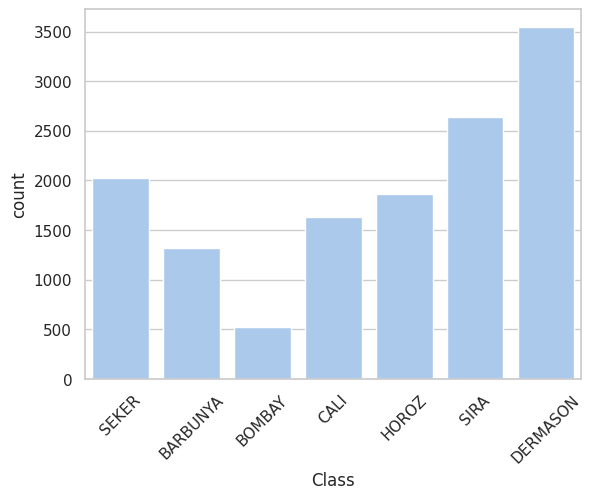

In [45]:
sns.countplot(data=df, x='Class')
plt.xticks(rotation=45)
plt.show()

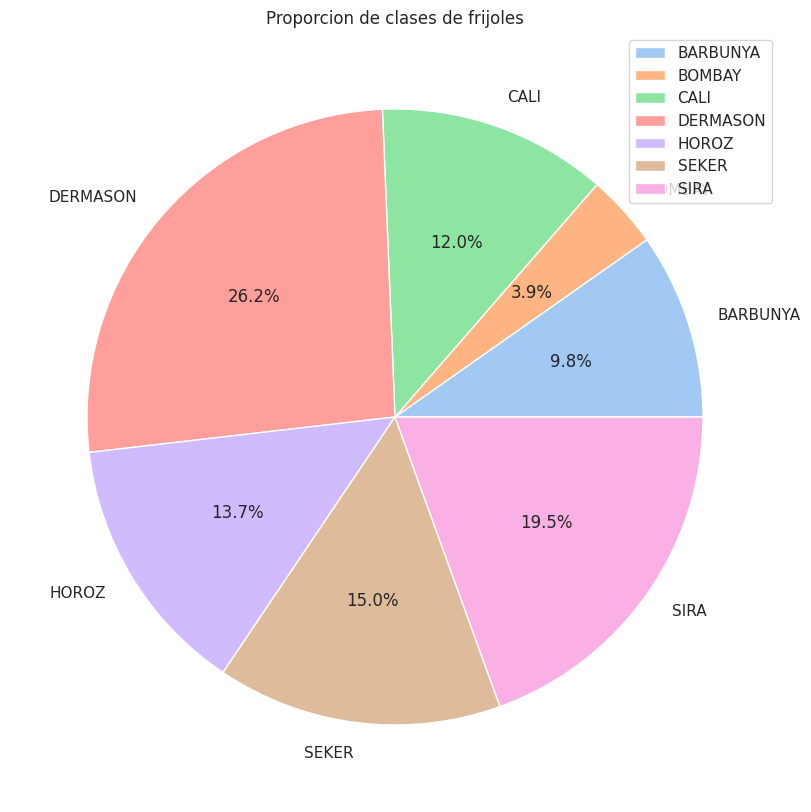

In [46]:
# Ver la proporcion en grafico de pie
labels, counts = np.unique(df['Class'], return_counts=True)

plt.figure(figsize=(10,10))
plt.pie(counts, autopct='%1.1f%%', labels=labels)
plt.title('Proporcion de clases de frijoles')
plt.legend()
plt.show()

Se observa una desproporción en la distribución de los tipos de frijoles en el conjunto de datos.

Los resultados muestran que Dermason y Sira representan más del 45% de las muestras totales, mientras que Bombay tiene una representación del 3.85%.

Se realizará un undersampling en lugar de un oversampling. Esto se debe a que un oversampling podría generar overfitting y una menor capacidad de generalización del modelo al duplicar o triplicar algunas muestras. El undersampling equilibra las clases y mejora la capacidad de generalización del modelo.

In [47]:
under_sampler = RandomUnderSampler(random_state=42)

In [48]:
# Quitar la variable objetivo
X = df.drop('Class', axis=1)
y = df['Class']

In [49]:
X_res, y_res = under_sampler.fit_resample(X, y)
y_res

2754    BARBUNYA
2506    BARBUNYA
2267    BARBUNYA
2449    BARBUNYA
2076    BARBUNYA
          ...   
8692        SIRA
7578        SIRA
7924        SIRA
9972        SIRA
9720        SIRA
Name: Class, Length: 3654, dtype: object

Todas nuestras dimensiones (X e Y) tienen la misma magnitud

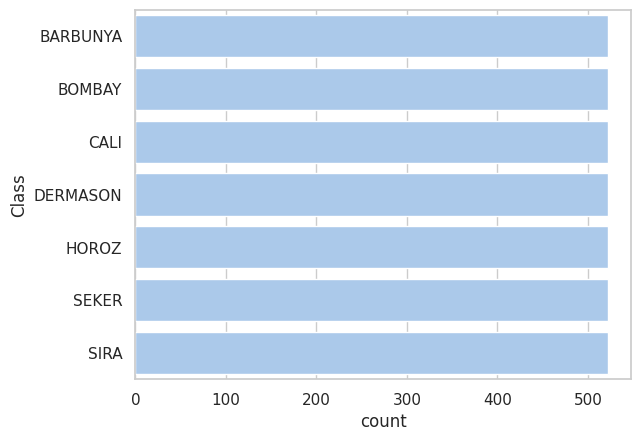

In [50]:
sns.countplot(data=y_res)
plt.show()

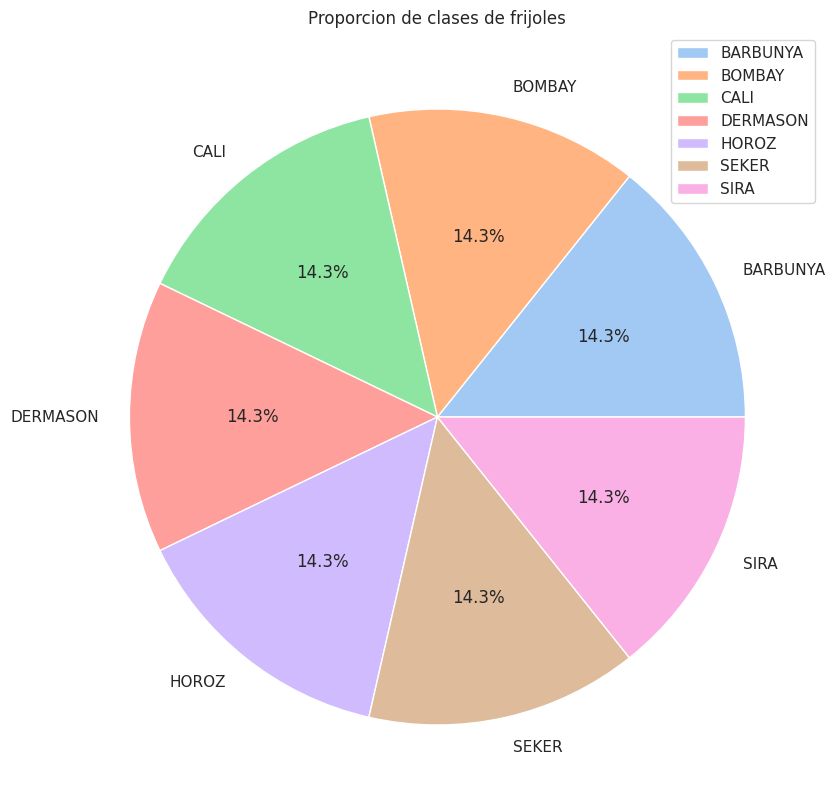

In [51]:
# Ver la proporcion en grafico de pie
labels, counts = np.unique(y_res, return_counts=True)

plt.figure(figsize=(10,10))
plt.pie(counts, autopct='%1.1f%%', labels=labels)
plt.title('Proporcion de clases de frijoles')
plt.legend()
plt.show()

Se redujo significativamente el tamaño del conjunto de datos de 13543 a 3654 al realizar undersampling. A pesar de la pérdida de datos, esto evita el riesgo de generar datos no relevantes y garantiza que los datos utilizados en el análisis sean reales y significativos.

In [52]:
df.shape

(13543, 17)

In [53]:
X_res.shape

(3654, 16)

## Conversion a numericos

In [54]:
# Convertir los datos de texto a numeros
list(np.unique(y_res))

['BARBUNYA', 'BOMBAY', 'CALI', 'DERMASON', 'HOROZ', 'SEKER', 'SIRA']

In [55]:
DICT = { key: item for key, item in zip(y_res.unique(), range(len(y_res.unique()))) }

In [56]:
y_res = pd.Series(map(lambda x : DICT[x], y_res))


In [57]:
y_res.replace(to_replace=0, value=1, inplace=True)

## Análisis exploratorio de datos

### Correlaccion

In [58]:
# Para analizar todo el conjunto
new_data = pd.concat([X_res, y_res], axis=1)
new_data.rename(columns={0: 'Class'}, inplace=True)

In [59]:
new_data.head()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
2754,70776.0,1060.894,386.619944,234.100208,1.651515,0.795842,71978.0,300.191276,0.775763,0.983300,0.790227,0.776451,0.005463,0.001225,0.602875,0.995658,5.0
2506,66370.0,1004.139,339.287072,249.883085,1.357783,0.676443,67637.0,290.697280,0.720536,0.981268,0.827169,0.856789,0.005112,0.001699,0.734087,0.996731,4.0
2267,60736.0,985.501,342.445302,226.741775,1.510288,0.749393,61680.0,278.085377,0.789353,0.984695,0.785854,0.812058,0.005638,0.001512,0.659438,0.995941,4.0
2449,65219.0,1011.110,353.650546,235.308999,1.502920,0.746512,66672.0,288.165594,0.719436,0.978207,0.801654,0.814831,0.005423,0.001475,0.663950,0.997864,4.0
2076,51332.0,889.637,330.822804,198.618899,1.665616,0.799716,52283.0,255.651975,0.751688,0.981811,0.815028,0.772776,0.006445,0.001418,0.597183,0.994678,3.0


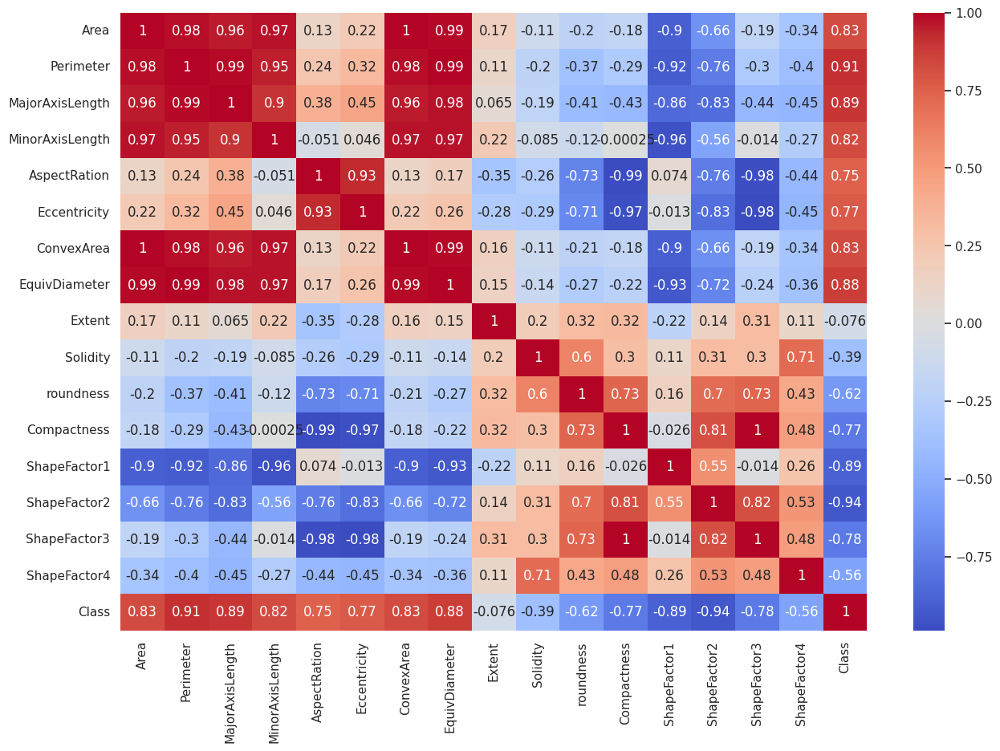

In [60]:
plt.figure(figsize=(15,10))
sns.heatmap(
    data=new_data.corr(),
    annot=True,
    cmap='coolwarm'
)
plt.show()

## Insight


En el análisis de correlación, se observó en el heatmap que la variable ConvexArea presenta una alta correlación con la variable Area, en una relación de 1 a 1, y también se encuentra altamente correlacionada con el Perimeter, MajorAxisLenght y MinorAxisLenght.

Por otro lado, la variable EquivDiameter muestra una alta correlación con las variables Area, Perimeter, Width y Length.

Estas correlaciones indican la presencia de multicolinealidad entre estas variables, por lo tanto, se procederá a dropear esas variables para evitar la multicolinealidad.

Eliminar las variables altamente correlacionada

In [61]:
X_res.drop(['ConvexArea', 'EquivDiameter'], axis=1, inplace=True)

## Visualizacion de datos

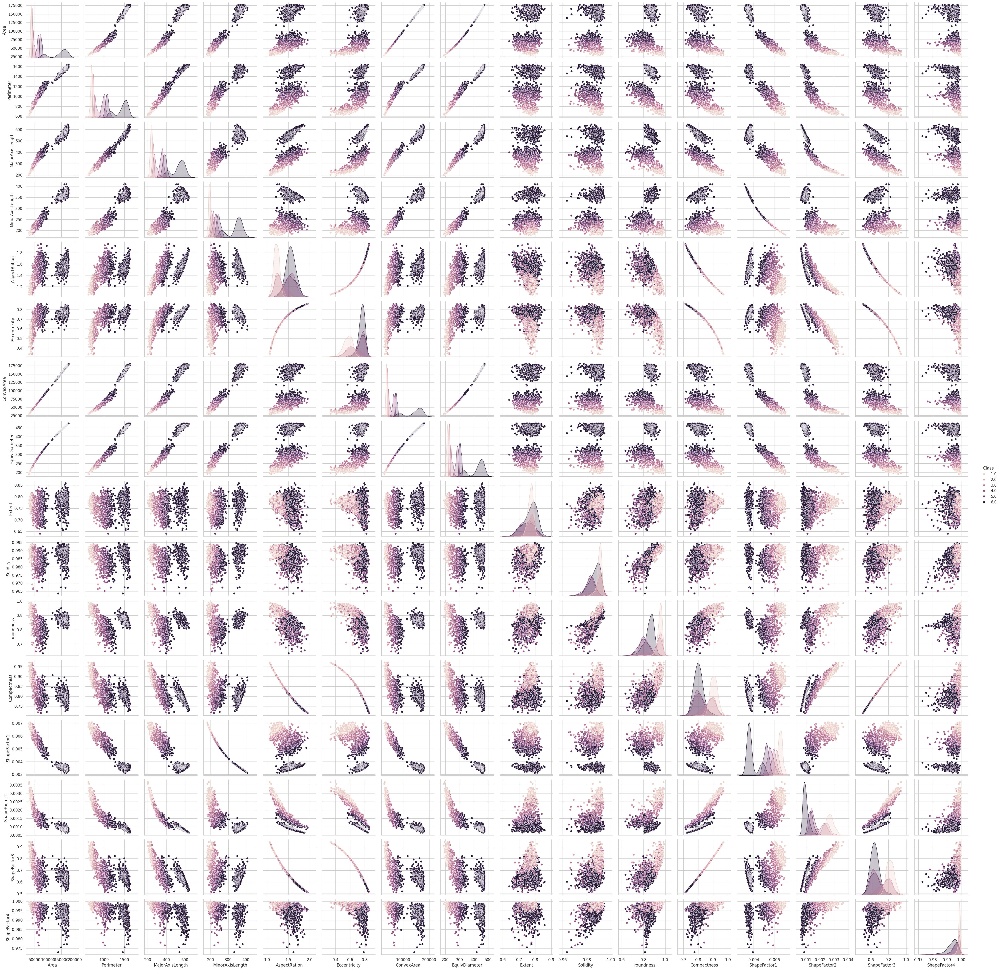

In [62]:
sns.pairplot(data=new_data, hue='Class');

## Split y Escalamiento de datos

In [141]:
# Hacer un split a los datos de entrenamiento y prueba.
X_train, X_test, y_train, y_test = train_test_split(X_res, y_res, test_size=0.2, random_state=42, shuffle=True)

In [142]:
# Aplicar el Estandarizacino en X
st_x = StandardScaler()
X_train = st_x.fit_transform(X_train)
X_test = st_x.transform(X_test)

## Modelo Multiclase

In [147]:
def logistic_model(C_, solver_, multi_class_):
    logistic_regression_model = LogisticRegression(max_iter=10000, random_state=42, solver=solver_, multi_class=multi_class_, n_jobs=-1, C=C_)
    return logistic_regression_model

In [148]:
model = logistic_model(1, 'saga', 'multinomial')
model.fit(X_train, y_train)

predictions = model.predict(X_test)

print(confusion_matrix(y_test, predictions))
print(accuracy_score(y_test, predictions))

[[214   7   0   1   1   3]
 [  7  95   0   0   0   1]
 [  0   0  90   0   5  10]
 [  0   4   1  91   0   0]
 [  3   0   0   0  84   4]
 [  0   1   6   6   0  97]]
0.9179206566347469


In [154]:
multiclass = ['ovr', 'multinomial']
solver_list = ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga']
score = []
params = []
for i in multiclass:
    for j in solver_list:
        try:
            model = logistic_model(1, j, i)
            model.fit(X_train, y_train)
            predictions = model.predict(X_test)
            params.append(i+'-'+j)
            accuracy = accuracy_score(y_test, predictions)
            score.append(accuracy)
        except:
            None

In [157]:
score
params


['ovr-newton-cg',
 'ovr-lbfgs',
 'ovr-liblinear',
 'ovr-sag',
 'ovr-saga',
 'multinomial-newton-cg',
 'multinomial-lbfgs',
 'multinomial-sag',
 'multinomial-saga']

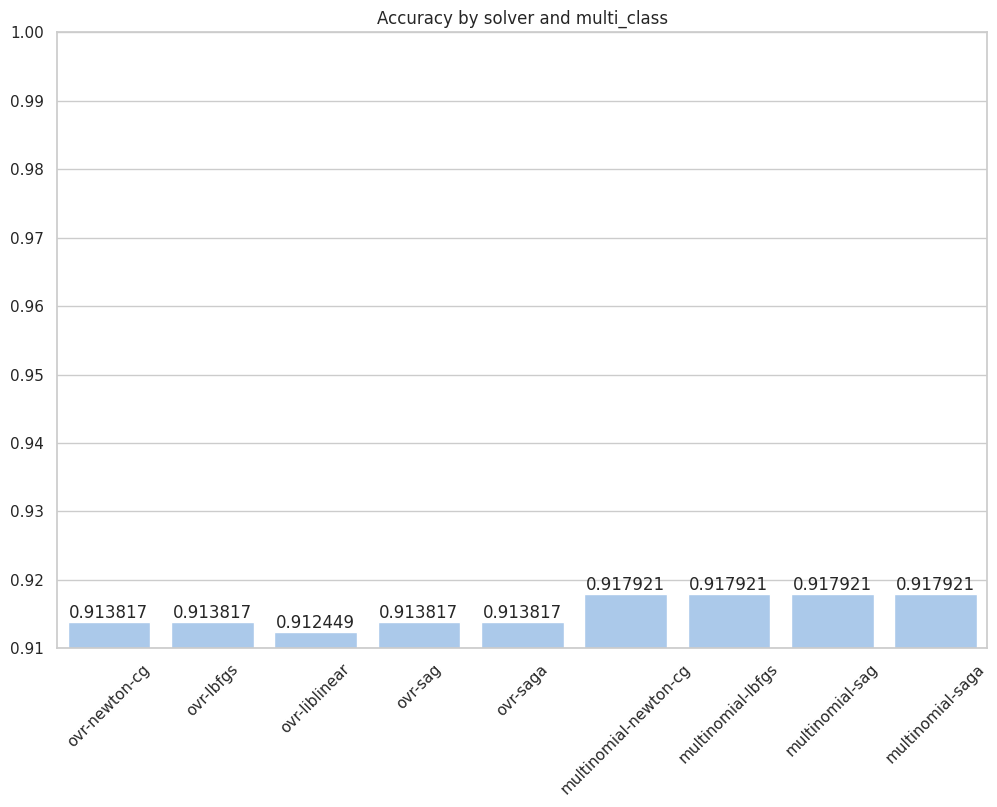

In [168]:
fig, axe = plt.subplots(figsize=(12, 8))

ax = sns.barplot(
    ax=axe,
    x=params,
    y=score,
)
ax.set_title('Accuracy by solver and multi_class')

ax.set_xticklabels(labels=params, rotation=45)
ax.bar_label(ax.containers[0])
plt.ylim([0.91, 1])
plt.show()

Una forma más sencilla de optimizar los hipeparámetros del modelo de Regresion Logistica es usando GridSearchCV

In [189]:
# Parameter grid
parameters = {
    'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
    'multi_class': ['ovr', 'multinomial']
}

In [190]:
logreg = LogisticRegression(max_iter=10000, n_jobs=-1, C=1)

clf = GridSearchCV(logreg, param_grid=parameters, scoring='accuracy', cv=5)

clf.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=LogisticRegression(C=1, max_iter=10000, n_jobs=-1),
             param_grid={'multi_class': ['ovr', 'multinomial'],
                         'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag',
                                    'saga']},
             scoring='accuracy')

Esto también se usa para otros modelos de regresión y clasificación

In [191]:
print("Mejores HiperParametros: ", clf.best_params_)
print("Mejor accuracy: ", clf.best_score_)

# creacion de lista para los solver y los puntajas
solvers = []
scores =[]
for params, mean_score in zip(clf.cv_results_['params'], clf.cv_results_['mean_test_score']):
    if params['multi_class'] == 'multinomial' and not np.isnan(mean_score):
        solvers.append(params['solver'])
        scores.append(mean_score)
    print("Parameters: ", params)
    print("Mean Score: ", mean_score)
    print('==============================================================')

Mejores HiperParametros:  {'multi_class': 'multinomial', 'solver': 'newton-cg'}
Mejor accuracy:  0.9315765132888421
Parameters:  {'multi_class': 'ovr', 'solver': 'newton-cg'}
Mean Score:  0.9281559536354056
Parameters:  {'multi_class': 'ovr', 'solver': 'lbfgs'}
Mean Score:  0.9281559536354056
Parameters:  {'multi_class': 'ovr', 'solver': 'liblinear'}
Mean Score:  0.9267866760332513
Parameters:  {'multi_class': 'ovr', 'solver': 'sag'}
Mean Score:  0.9281559536354056
Parameters:  {'multi_class': 'ovr', 'solver': 'saga'}
Mean Score:  0.9281559536354056
Parameters:  {'multi_class': 'multinomial', 'solver': 'newton-cg'}
Mean Score:  0.9315765132888421
Parameters:  {'multi_class': 'multinomial', 'solver': 'lbfgs'}
Mean Score:  0.9315765132888421
Parameters:  {'multi_class': 'multinomial', 'solver': 'liblinear'}
Mean Score:  nan
Parameters:  {'multi_class': 'multinomial', 'solver': 'sag'}
Mean Score:  0.9315765132888421
Parameters:  {'multi_class': 'multinomial', 'solver': 'saga'}
Mean Score:

In [181]:
solvers

['newton-cg', 'lbfgs', 'saga', 'sag']

In [182]:
scores

[0.9315765132888421,
 0.9315765132888421,
 0.9315765132888421,
 0.9315765132888421]

El modelo clf ya se encuentra entrenado con los mejores hiperparámetros por lo que yase encuentra listo para hacer predicciones

In [183]:
predictions_2 = clf.predict(X_test)
print(confusion_matrix(y_test, predictions_2))
print("\n",accuracy_score(y_test, predictions_2))

[[214   7   0   1   1   3]
 [  7  95   0   0   0   1]
 [  0   0  90   0   5  10]
 [  0   4   1  91   0   0]
 [  3   0   0   0  84   4]
 [  0   1   6   6   0  97]]

 0.9179206566347469


## Evaluacion de resultados

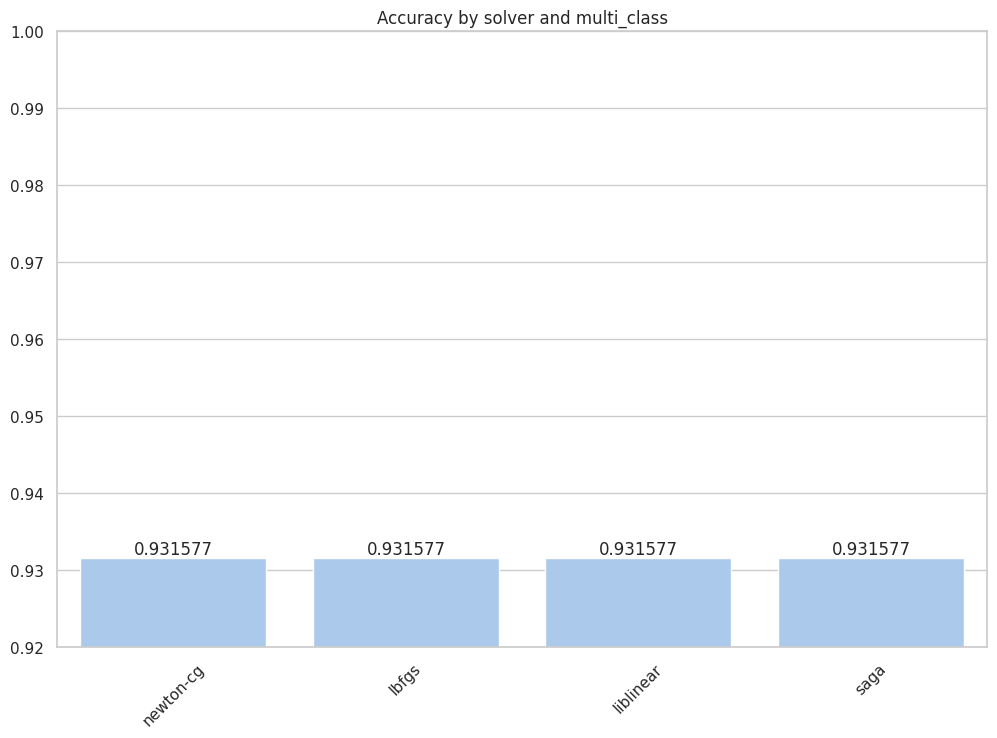

In [187]:
fig, axe = plt.subplots(figsize=(12, 8))

ax = sns.barplot(
    ax=axe,
    x=solvers,
    y=scores,
)
ax.set_title('Accuracy by solver and multi_class')

ax.set_xticklabels(labels=parameters['solver'], rotation=45)
ax.bar_label(ax.containers[0])
plt.ylim([0.92, 1])
plt.show()

pensando que habia overfiting use cross validation para verificar:

In [188]:
kfold = KFold(n_splits=5, shuffle=True, random_state=42)

results_k = cross_val_score(clf, X_test, y_test, cv=kfold)

print(results_k.mean())



0.9206318143695835


el score es muy similar, lo que nos indicaria que no hay Overfiting

Vamos a usar los mejores hiperparametros

In [192]:
model = logistic_model(1, 'newton-cg', 'multinomial')
model.fit(X_train, y_train)

predictions = model.predict(X_test)

print(confusion_matrix(y_test, predictions))
print(accuracy_score(y_test, predictions))

[[214   7   0   1   1   3]
 [  7  95   0   0   0   1]
 [  0   0  90   0   5  10]
 [  0   4   1  91   0   0]
 [  3   0   0   0  84   4]
 [  0   1   6   6   0  97]]
0.9179206566347469


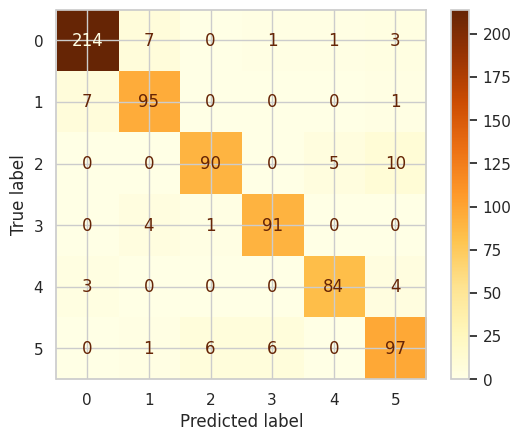

In [196]:
import matplotlib.pyplot as plt
cm = confusion_matrix(y_test, predictions, labels=model.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=plt.cm.YlOrBr)
plt.show()

Después de probar diferentes combinaciones de parámetros en nuestro modelo de regresión logística, obtuvimos el mejor desempeño utilizando la estrategia de clasificación multinomial (multi_class='multinomial') y el solver 'lbfgs'.

Con esta configuración, logramos obtener una precisión (accuracy) del 91.79%, lo que indica una buena capacidad del modelo para clasificar correctamente los tipos de frijoles en el conjunto de datos.